# **Домашнее задание по машиноому обучению №1**
# *Задача классификации*

Был выбран датасет для *оценки качества вина*. Выбран он был из следующих соображений:

*   Большое количество объектов: 6497
*   13 признаков:

1.   type - тип вина(red/white). Качественный признак
2.   fixed acidity(г/л) - фиксированная кислотность
3.   volatile acidity(г/л) - летучая кислотность
4.   citric acid(г/л) - лимонная кислота
5.   residual sugar(г/л) - остаточный сахар
6.   chlorides(г/л) - хлориды
7.   free sulfur dioxide(мг/л) - свободный диоксид серы
8.   total sulfur dioxide(г/мл) - общий диоксид серы
9.   density(г/мл) - плотность
10.  pH(от 0 - высокая кислотность до 14 - очень щелочное) - показатель кислотности
11.  sulphates(г/л) - сульфаты
12.  alcohol(%) -  алкоголь
13.  quality (score between 0 and 10) - качество, оцененное сенсорным методом

*   Есть пропущенные значения
*   Разнородные признаки
*   Несбалансированные классы

Хотя в датасете отсутствует информация, которая могла бы существенно облегчить задачу оценки качества вина, такая как сорт винограда, марка вина, а также место производства винограда, всё равно утвержается, что этот датасет хорош для отработки алгоритмов машинного обучения. 




## 0. Постановка задачи:
По набору из 12 признаков методом k-ближайших соседей распределить вина в два класса: качественные и некачественные вина. Разделение проведём так: quality  ≥ 6 - качественные, остальные некачественные.

## 0.1 "Физическое" понимание задачи
Сначала нужно разобраться с ролью каждого компонента:
2. Фикисрованная кислотность - нелетучие кислоты, не испаряются быстро. Включает в себя лимонную кислоту, винную, яблочную и молочную. 
3. Летучая кислотность – показатель, характеризующий здоровье виноматериалов. Летучая кислотность возрастает при окислении вина и в результате микробиальных заболеваний. Основная летучая кислота - уксуная. Известно, что летучая кислотность считается дефектом в винах.
4. Лимонная кислота - используется как недорогая кислотная добавка для повышения общей кислотности вина. Может добавить агрессивный лимонный вкус.
5. Остаточный сахар - это натуральный виноградный сахар, оставшийся в вине после окончания алкогольного брожения. 
6. Хлориды - отвечают за солёность вина.
7. Свободный диоксид серы защищает вино от микробов, бактерий, нежелательных дрожжей. Препятствуют окислению, а также потере цвета.
Известно, что в красном вине меньше диоксида серы, чем в белом. В производстве красного вина активно участвует кожица и косточки винограда, из которой экстрагируются полифенолы (они же танины) и антоцианы, отвечающие за цвет. Оба эти вещества являются антиоксидантами, которые защищают вино от необратимого действия кислорода, поэтому сера нужна красному вину в меньших количествах.
Если совсем не добавлять диоксид серы, то продукт из виноградного сока будет уксусом.
8. Есть свободная и связанная форма диоксида серы. В вине их соотношение 10-30% / 90-70%. Их сумма - общий дикосид серы.
9. Плотность. Чем ниже уровень алкоголя и сахара в вине, тем он получается плотнее и тяжелее, так как виноградный сок имеет плотность больщую, чем вода, а алкоголь - меньшую.
10. pH - активная кислотность. Кислотность измеряется по шкале pH, при этом более низкое значение pH указывает на более высокий уровень кислоты, в то время как высокий pH означает более низкую кислотность. Стабильность вин с высокой кислотностью / низким pH помогает при выдержке. При высоком рН вина легко поражаются бактериальными заболеваниями, больше подвержены окислению. 
То есть, можно сказать, что pH - это свойства при хранении вин, а фиксированная кислотность отвечает за вкусовые качества. 
Если активная кислотность выше, то скорее всего выше будет и количество серы или алкоголя чтобы сделать вино микробиологически стабильным. 
11. Сульфаты - это добавка для вина, которая может способствовать повышению уровня свободного диоксида серы.


Что возможно предсказать только из вышеуказанной информации?
1. Чем больше летучая кислотность, тем хуже качество вина.
2. Диоксида серы меньше в красном вине.
3. При низком pH требуется меньше серы.
4. Высокая фиксированная кислотность задаёт меньший pH. 
5. Возможна линейая зависимость между лимонной кислотой и фиксированной кислотностью.
6. Возможно, чем больше лимонной кислоты, тем хуже качество.

Проверим эти утверждения и попытаемся понять, как имея данную информацию оценить качество вина. 

In [47]:
import numpy as np              # Массивы (матрицы, векторы, линейная алгебра)
import matplotlib.pyplot as plt # Научная графика
%matplotlib inline 
    # Говорим jupyter'у, чтобы весь графический вывод был в браузере, а не в отдельном окне
import pandas as pd             # Таблицы и временные ряды (dataframe, series)
import seaborn as sns           # Еще больше красивой графики для визуализации данных
import sklearn                  # Алгоритмы машинного обучения

# 1. Чтение данных

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/unn/1term/mlcourse/winequalityN.csv",  sep=',')

Размеры таблицы:

In [ ]:
data.shape

(6497, 13)

Посмотрим верхние строки, а затем последние:

In [ ]:
data.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
data.tail()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
6496,red,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


Все признаки, кроме type - числовые, type - категориальный. Пока значения type имеют тип 'Object'. Заменим тип на специальный, предназначенный для хранения категориальных значений:

In [ ]:
data['type'].dtype

dtype('O')

In [ ]:
data['type'] = data['type'].astype('category')

In [ ]:
data['type'].dtype

CategoricalDtype(categories=['red', 'white'], ordered=False)

# 2. Визуализация и описательная статистика

Получим сводную информацию о признаках:

1) Количественные признаки:

In [ ]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


2) Категориальные признаки:

In [ ]:
data['type'] = data['type'].astype('category')
data.describe(include=['category'])

,type
count,6497
unique,2
top,white
freq,4898


Значит, число описанных экземпляров белого вина в выборке больше красного. Белого вина - 4898, красного же 1599.

Построим все возможные диаграммы рассеивания для каждой пары переменных. Постараемся увидеть какие-нибудь зависимости, которые рассмотрим потом подробнее.

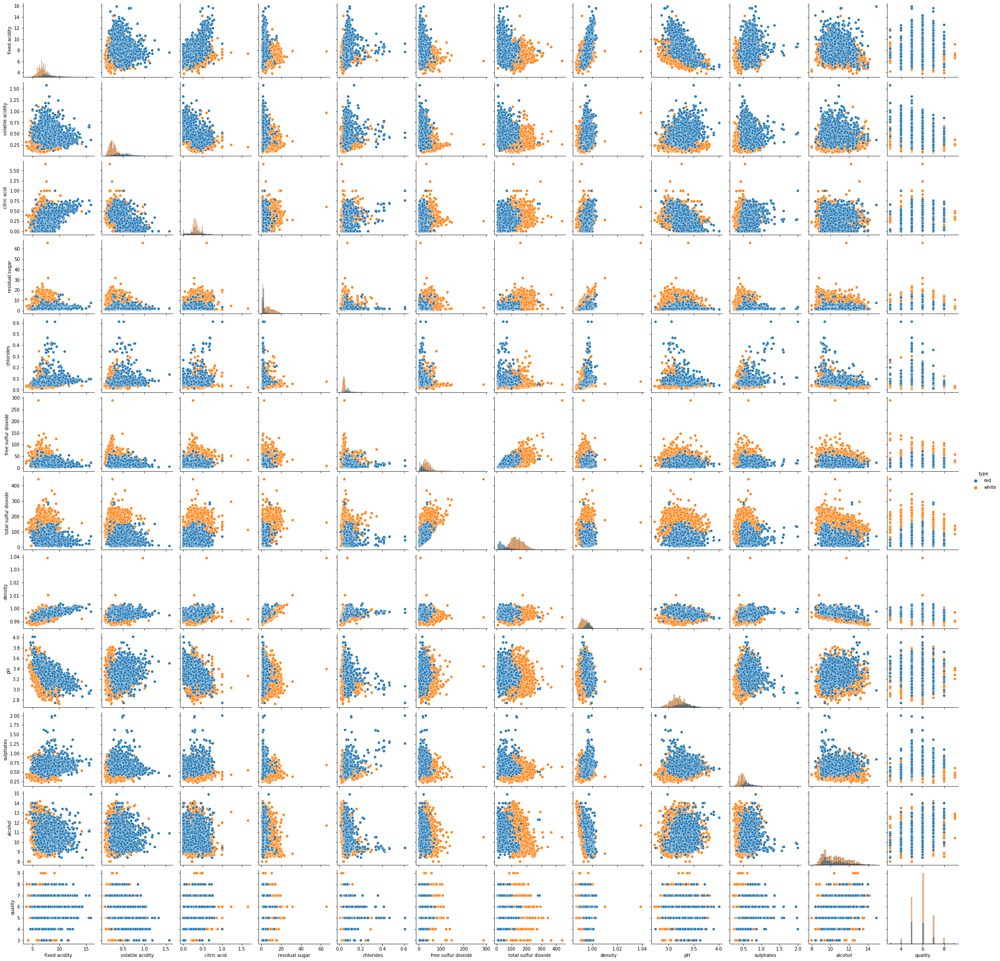

In [ ]:
np.random.seed(42)
sns.pairplot(data, hue='type', diag_kind='hist')
pass

Отрисовка всех точек требует много времени. И данные плохо видно, так как они накладываются друг на друга. Выберем 1000 случайных точек для отрисовки.

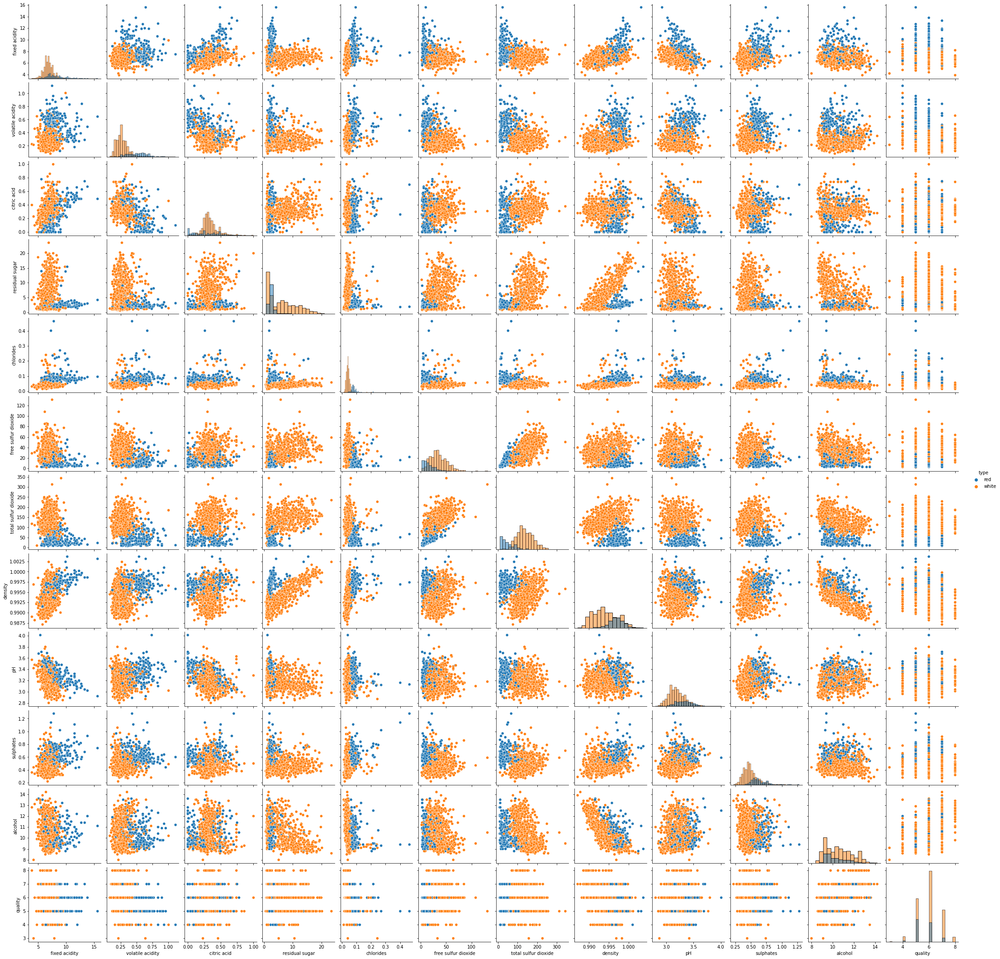

In [ ]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(data.shape[0]), size=1000, replace=False)
sns.pairplot(data.iloc[random_subset], hue='type', diag_kind='hist')
pass

Проверим гипотезы, которые мы составили в описании задачи. 

1) Чем больше летучая кислотность, тем хуже качество вина. 
- для этого построим отдельную диаграмму рассеивания:

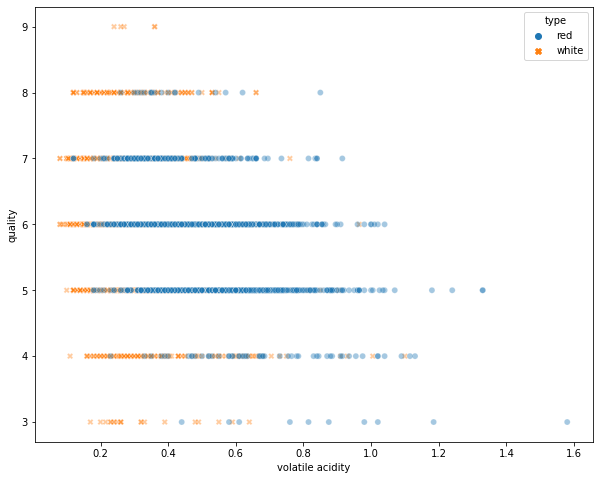

In [ ]:
plt.figure(figsize = (10, 8))
sns.scatterplot(x='volatile acidity', y='quality', hue='type', style = 'type', data = data, alpha=0.4)
pass

Определённая зависимость есть: вина, которые мы относим к качественным (quality ≥ 6) имеют летучую кислотность меньше 1.0. Вина же некачественные могут иметь летучую кислотность вплоть до 1.5. Также видно, что в красном вине больше летучих кислот. Проверим это конкретнее: 

In [ ]:
filter_good = data['quality'] >= 6
good_wine = data.loc[filter_good]
max_volatile_acidity = max(good_wine['volatile acidity'])
max_volatile_acidity

1.04

Значит, хорошие вина имеют максимальное значение летучей кислотности 1.04 г/л

In [ ]:
filter_bad = data['quality'] < 6
bad_wine = data.loc[filter_bad]

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


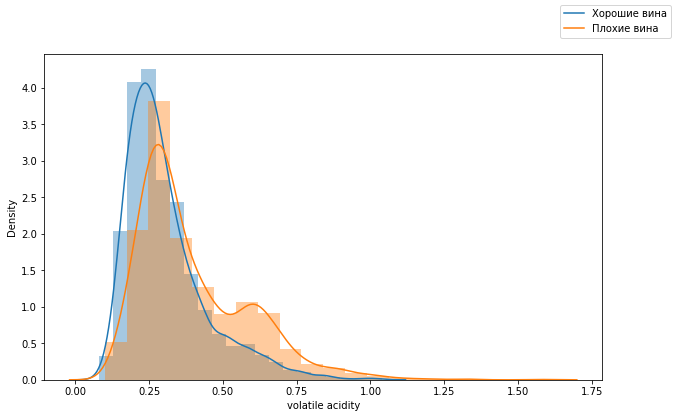

In [ ]:
fig = plt.figure(figsize=(10,6))
sns.distplot(good_wine['volatile acidity'], bins=20)
sns.distplot(bad_wine['volatile acidity'], bins=20)
fig.legend(labels=['Хорошие вина','Плохие вина'])
plt.show()

Видно, что и хорошие и плохие вина имеют преимущественно малые (<0.29) значения летучей кислотности. Но количество плохих вин с большими значениями летучей кислотности больше, чем количество хороших вин. Значит, летучая кислотность влияет на качество вина, но не напрямую.

2) Диоксида серы меньше в красном вине. Это видно по столбцу free sulfur dioxide. А также можно посмотреть бокс-диаграмму для этих признаков.


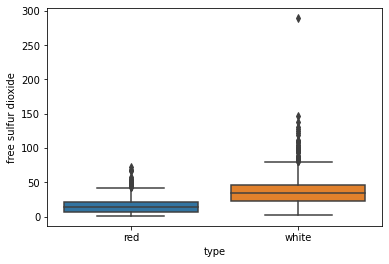

In [ ]:
sns.boxplot(x="type", y="free sulfur dioxide", data=data)
pass

3) При низком pH требуется меньше серы - этого не видно на графиках.

4) У фиксированной кислотности и pH действительно есть корреляция:

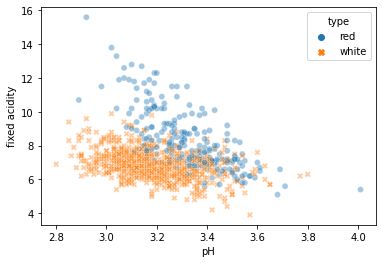

In [ ]:
sns.scatterplot(x='pH', y='fixed acidity', hue='type', style = 'type', data = data.iloc[random_subset], alpha=0.4)
pass

Кислотность измеряется по шкале pH, при этом более низкое значение pH указывает на более высокий уровень фиксированной кислотности (а не летучей).

5) Лимонная кислота и фиксированная кислотность связаны, как и ожидалось, линейно, так как лимонная кислота входит в состав фиксированной кислотности.

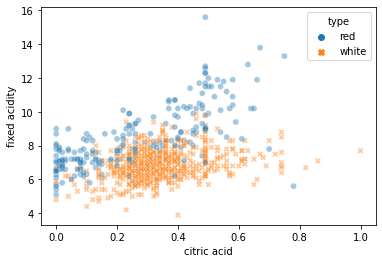

In [ ]:
sns.scatterplot(x='citric acid', y='fixed acidity', hue='type', style = 'type', data = data.iloc[random_subset], alpha=0.4)
pass

6) Чем больше лимонной кислоты, тем хуже качетсво? Нет такой явной зависимости.

**Матрица корреляции**

In [ ]:
corr_mat = data.corr()
corr_mat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.220172,0.323736,-0.112319,0.298421,-0.283317,-0.329747,0.459204,-0.251814,0.300380,-0.095603,-0.077031
volatile acidity,0.220172,1.000000,-0.378061,-0.196702,0.377167,-0.353230,-0.414928,0.271193,0.260660,0.225476,-0.038248,-0.265953
citric acid,0.323736,-0.378061,1.000000,0.142486,0.039315,0.133437,0.195218,0.096320,-0.328689,0.057613,-0.010433,0.085706
residual sugar,-0.112319,-0.196702,0.142486,1.000000,-0.128902,0.403439,0.495820,0.552498,-0.267050,-0.185745,-0.359706,-0.036825
chlorides,0.298421,0.377167,0.039315,-0.128902,1.000000,-0.195042,-0.279580,0.362594,0.044806,0.395332,-0.256861,-0.200886
free sulfur dioxide,-0.283317,-0.353230,0.133437,0.403439,-0.195042,1.000000,0.720934,0.025717,-0.145191,-0.188489,-0.179838,0.055463
total sulfur dioxide,-0.329747,-0.414928,0.195218,0.495820,-0.279580,0.720934,1.000000,0.032395,-0.237687,-0.275381,-0.265740,-0.041385
density,0.459204,0.271193,0.096320,0.552498,0.362594,0.025717,0.032395,1.000000,0.011920,0.259454,-0.686745,-0.305858
pH,-0.251814,0.260660,-0.328689,-0.267050,0.044806,-0.145191,-0.237687,0.011920,1.000000,0.191248,0.121002,0.019366
sulphates,0.300380,0.225476,0.057613,-0.185745,0.395332,-0.188489,-0.275381,0.259454,0.191248,1.000000,-0.003261,0.038729


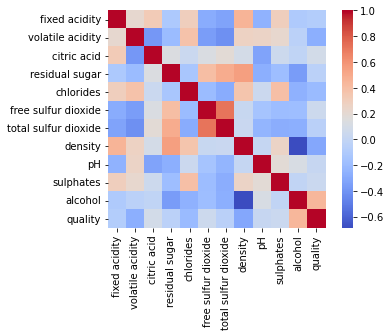

In [ ]:
sns.heatmap(corr_mat, square=True, cmap='coolwarm')
pass

Выведем коэффициенты корреляции, большие заданного значения:

In [ ]:
corr_mat > 0.5

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,True,False,False,False,False,False,False,False,False,False,False,False
volatile acidity,False,True,False,False,False,False,False,False,False,False,False,False
citric acid,False,False,True,False,False,False,False,False,False,False,False,False
residual sugar,False,False,False,True,False,False,False,True,False,False,False,False
chlorides,False,False,False,False,True,False,False,False,False,False,False,False
free sulfur dioxide,False,False,False,False,False,True,True,False,False,False,False,False
total sulfur dioxide,False,False,False,False,False,True,True,False,False,False,False,False
density,False,False,False,True,False,False,False,True,False,False,False,False
pH,False,False,False,False,False,False,False,False,True,False,False,False
sulphates,False,False,False,False,False,False,False,False,False,True,False,False


In [ ]:
corr_mat.where(np.triu(corr_mat > 0.5, k=1)).stack().sort_values(ascending=False)

free sulfur dioxide  total sulfur dioxide    0.720934
residual sugar       density                 0.552498
dtype: float64

# 3. Обработка пропущенных значений

Посмотрим, сколько пропущенных значений в каждом столбце матрицы:

In [ ]:
data.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

Заполню пропущенные значения медианой. Отстутсвующие значения есть только у количественных признаков.

In [ ]:
data.fillna(data.median(axis = 0), axis=0 , inplace=True)

In [ ]:
data.isna().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# 4. Обработка категориальных признаков

In [ ]:
data['type'] = pd.factorize(data['type'])[0]

In [ ]:
data['quality'] = (data['quality'] >= 6).astype(int)

In [ ]:
data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,0,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,0,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,0,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,0,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,1,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,0
6493,1,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.51,11.2,1
6494,1,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,1
6495,1,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,0


type:
0 - White 
1 - Red

quality:
0 - bad
1 - good

Посчитаем количество в выборке экземпляров хорошего и плохого вина.

In [34]:
element_count_good = len([item for item in data_filter['quality'] if item != 0])
element_count_bad = data_filter.shape[0] - element_count_good
element_count_good

3820

In [33]:
element_count_bad

2198

Количество плохих вин в выборке: 2198
Количество хороших вин в выборке: 3820

**Борьба с выбросами**

Так как выбросы вносят неверные данные в наши выборки, то следует во всех признаках избавиться от них.

In [ ]:
data.shape

(6497, 13)

In [ ]:
data_filter = data.copy()
for i in range(2, 12):
    rows_to_drop = data_filter[(data_filter[data_filter.columns[i]] < data_filter[data_filter.columns[i]].quantile(0.005)) | (data_filter[data_filter.columns[i]] > data_filter[data_filter.columns[i]].quantile(0.995))].index
    data_filter = data_filter.drop(rows_to_drop)
data_filter.shape

(6018, 13)

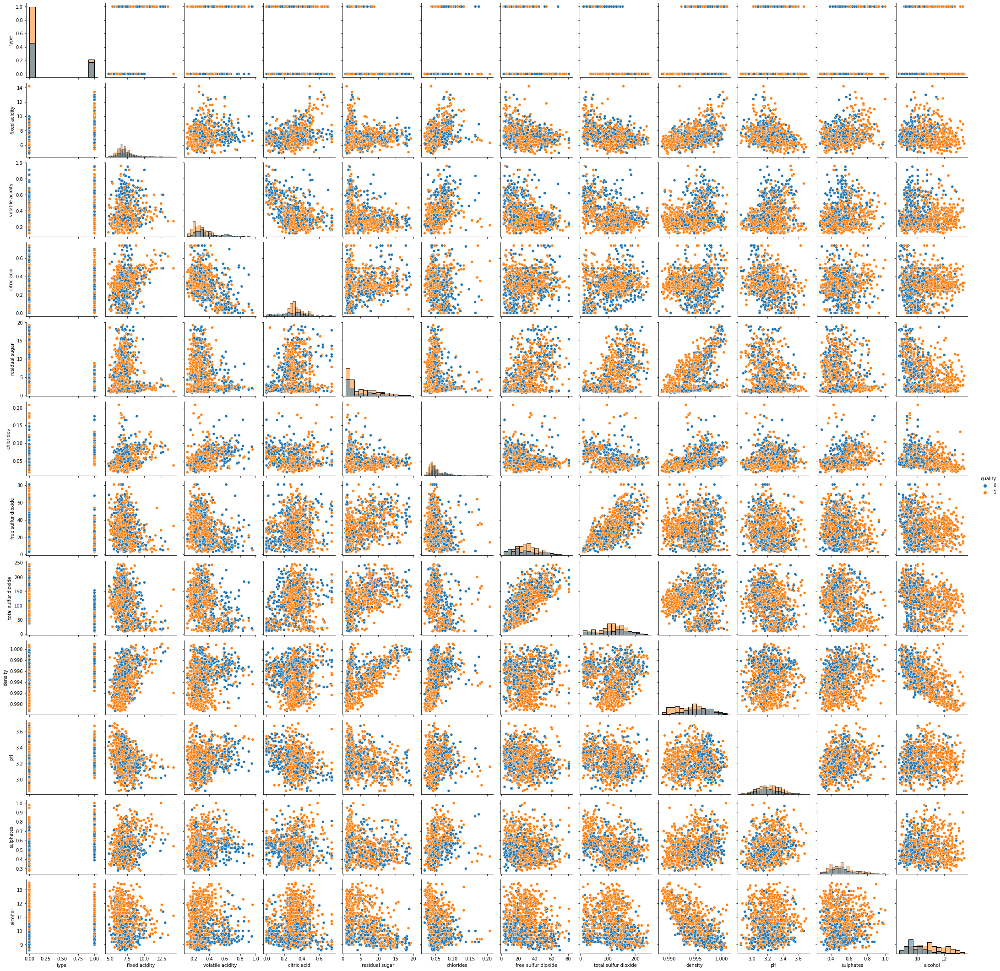

In [22]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(data_filter.shape[0]), size=1000, replace=False)
sns.pairplot(data_filter.iloc[random_subset], hue='quality', diag_kind='hist')
pass

# 5. Нормализация количественных признаков



Провожу *стандартизацию* - линейное преобразование, приводящее все значения к нулевому среднему и единичному стандартному отклонению. Делается это потому что метод kNN чувствителен к масштабированию данных.

In [35]:
data_stand = (data_filter - data_filter.mean(axis = 0))/data_filter.std(axis = 0)
data_stand

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1,-0.558239,-0.735840,-0.227182,0.174470,-0.832082,-0.204217,-0.987752,0.291626,-0.233625,0.532108,-0.272384,-0.843412,0.758483
2,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
3,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
4,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
5,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,1.791050,-0.817580,1.699515,-1.711339,-0.744527,1.402237,0.099464,-1.308999,0.083627,1.514324,0.416551,0.027965,-1.318201
6493,1.791050,-1.062799,1.378398,-1.566277,-0.700749,0.305147,0.522270,-1.181676,0.161178,1.972692,-0.119287,0.637930,0.758483
6494,1.791050,-0.735840,1.121505,-1.348683,-0.678861,0.853692,-0.081739,-1.381755,0.379729,1.317881,1.717872,0.463654,0.758483
6495,1.791050,-1.062799,1.988519,-1.421214,-0.744527,0.814510,0.099464,-1.308999,0.284554,2.300098,1.411679,-0.233448,-1.318201


# 6. Отбор признаков

Для предсказания качества вина буду использовать все входные признаки, кроме quality.

In [42]:
data_stand.columns

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'],
      dtype='object')

In [53]:
X = data_stand.drop(['quality'], axis=1)
y = data_filter['quality']

Разобьем данные на обучающую и тестовую выборки в пропорции 3:1 (75% - обучающая выборка, 25% - тестовая):

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 

N_train, N_test

(4513, 1505)

# 7. Классификатор ближайших соседей

In [55]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [56]:
y_test_predict = knn.predict(X_test)
err_test  = np.mean(y_test  != y_test_predict)

In [57]:
err_test

0.24518272425249169

In [58]:
knn.score(X_test, y_test)

0.7548172757475083

Нужно выбрать наилучшее число соседей:

In [65]:
error_train = []
error_test = []
for i in range(1, 20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    predict_i = knn.predict(X_test)
    predict_a_i = knn.predict(X_train)
    error_test.append(np.mean(y_test != predict_i))
    error_train.append(np.mean(y_train != predict_a_i))

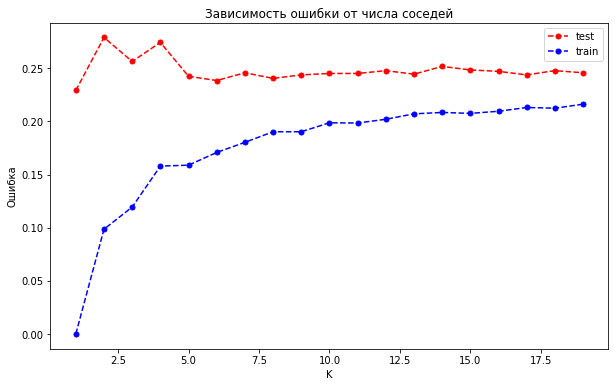

In [68]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_test,color='red', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=5)
plt.plot(range(1,20),error_train,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=5)
plt.title('Зависимость ошибки от числа соседей')
plt.xlabel('K')
plt.ylabel('Ошибка')
plt.legend(labels=['test','train'])

In [72]:
error_test

[0.2292358803986711,
 0.27906976744186046,
 0.2564784053156146,
 0.2744186046511628,
 0.2425249169435216,
 0.23853820598006645,
 0.24584717607973422,
 0.24053156146179402,
 0.24385382059800664,
 0.24518272425249169,
 0.24518272425249169,
 0.2478405315614618,
 0.24451827242524918,
 0.25182724252491695,
 0.24850498338870433,
 0.24717607973421926,
 0.24385382059800664,
 0.2478405315614618,
 0.24584717607973422]

In [74]:
error_train[1]

0.09860403279415023

Видно, что ошибка на тестовой выборке варьируется в пределах от 0.229 до 0.279. Значит, оптимальное количество соседей k = 1.

Проверим это с помощью GridSearchCV.

In [73]:
from sklearn.model_selection import GridSearchCV
nnb = list(range(1,20))+[25, 35, 45, 55]
knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid = {'n_neighbors': nnb}, cv=10)
grid.fit(X_train, y_train)

best_cv_err = 1 - grid.best_score_
best_n_neighbors = grid.best_estimator_.n_neighbors
print(best_cv_err, best_n_neighbors)

0.22180356336950324 1


*При k = 1*

Ошибка на тестовой выборке: 0.229

Ошибка на обучающей выборке: 0.099

## Воспользуюсь ещё классификатором Random Forest.

In [76]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)
error_train = np.mean(y_train != rfc.predict(X_train))
error_test  = np.mean(y_test  != rfc.predict(X_test))

print('Ошибка на обучающей выборке: ', error_train)
print('Ошибка на тестовой выборке: ', error_test)

Ошибка на обучающей выборке:  0.0
Ошибка на тестовой выборке:  0.17940199335548174


## Выводы:
В работе был проведен анализ данных, выявлены некоторые зависиомости, характерные для вин (раздел "визуализация"). 

Что касается зависиомсти качетсва вин от их параметров - линейных зависимостей не обнаружено, так как химические свойства влияют на качество вина в хитрых пропорциях. 

Всё же обнаружена одна зависимость, которая говорит, что качетсво вина ухудшается с увеличением летучей кислотности.

Было проведена классификация методом ближайших соседей, ошибка этого метода составила ~23%. Методом Random Forest ~18%.

# **Домашнее задание по машиноому обучению №2**
## Использование нейронной сети для нашей задачи

In [78]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

## Проверяю качество классификатора

In [85]:
mlp_model = MLPClassifier(hidden_layer_sizes = (100,),
                          activation = 'logistic',
                          solver = 'lbfgs', 
                          random_state = 42,
                          max_iter = 10000)
mlp_model.fit(X_train, y_train)
y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

**Ошибки на обучающей и тестовой выборках:**

In [86]:
print(np.mean(y_train != y_train_pred), np.mean(y_test != y_test_pred))

0.0 0.24983388704318937


In [ ]:
y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

### **Подбираю оптимальный гипер-параметр alpha**

In [82]:
alpha_arr = np.logspace(-3, 2, 21)
test_err = []
train_err = []
train_acc = []
test_acc = []

for alpha in alpha_arr:
    mlp_model = MLPClassifier(alpha = alpha, 
                              hidden_layer_sizes = (100,), 
                              solver = 'lbfgs', 
                              activation = 'logistic', 
                              max_iter= 10000, 
                              random_state = 42)
    mlp_model.fit(X_train, y_train)

    y_train_pred = mlp_model.predict(X_train)
    y_test_pred = mlp_model.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))
    train_acc.append(accuracy_score(y_train, y_train_pred))
    test_acc.append(accuracy_score(y_test, y_test_pred))

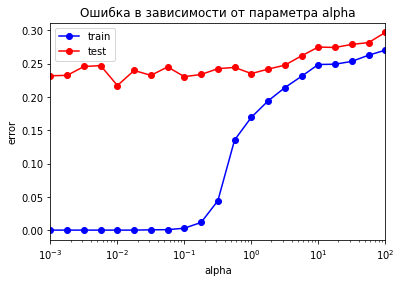

In [83]:
plt.semilogx(alpha_arr, train_err, 'b-o', label = 'train')
plt.semilogx(alpha_arr, test_err, 'r-o', label = 'test')
plt.xlim([np.min(alpha_arr), np.max(alpha_arr)])
plt.title('Ошибка в зависимости от параметра alpha')
plt.xlabel('alpha')
plt.ylabel('error')
plt.legend()

Рассмотрим, как менялась метрика в зависимости от гиперпараметра:

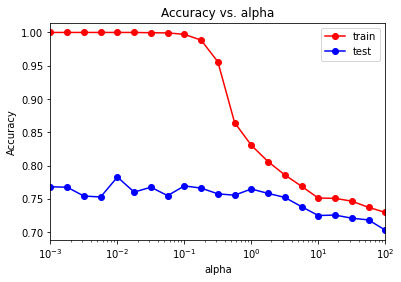

In [87]:
plt.semilogx(alpha_arr, train_acc, 'r-o', label = 'train')
plt.semilogx(alpha_arr, test_acc, 'b-o', label = 'test')
plt.xlim([np.min(alpha_arr), np.max(alpha_arr)])
plt.title('Accuracy vs. alpha')
plt.xlabel('alpha')
plt.ylabel('Accuracy')
plt.legend()

Минимальное значение ошибки:

In [88]:
min_train_err = np.min(train_err)
min_test_err = np.min(test_err)
print(min_train_err, min_test_err)

0.0 0.21727574750830564


Оптимальное значение `alpha`:

In [92]:
alpha_opt = alpha_arr[test_err == min_test_err]
print(alpha_opt)

[0.01]


In [93]:
alpha_opt = alpha_opt[0]

## Классификатор при найденном оптимальном значении `alpha`:

In [95]:
mlp_model = MLPClassifier(alpha = alpha_opt, 
                              hidden_layer_sizes = (100,), 
                              solver = 'lbfgs', 
                              activation = 'logistic', 
                              max_iter= 10000, 
                              random_state = 42)
mlp_model.fit(X_train, y_train)

y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)
print(np.mean(y_train != y_train_pred))
print(np.mean(y_test != y_test_pred))

0.0
0.21727574750830564


## **Матрица рассогласования:**

In [96]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test_pred, y_test))

[[391 173]
 [154 787]]


## Найду оптимальное количество нейронов первого скрытого слоя при оптимальном значении alpha:

In [119]:
hidden_layer = np.arange(1, 50)
test_err = []
train_err = []
train_acc = []
test_acc = []

for neuron in hidden_layer:
    mlp_model = MLPClassifier(alpha = alpha_opt, hidden_layer_sizes = (neuron,), solver = 'lbfgs', max_iter = 10000,
                              activation = 'logistic', random_state = 42)
    
    mlp_model.fit(X_train, y_train)

    y_train_pred = mlp_model.predict(X_train)
    y_test_pred = mlp_model.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))
    train_acc.append(accuracy_score(y_train, y_train_pred))
    test_acc.append(accuracy_score(y_test, y_test_pred))

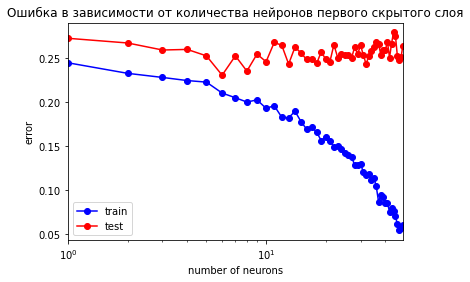

In [121]:
plt.semilogx(hidden_layer, train_err, 'b-o', label = 'train')
plt.semilogx(hidden_layer, test_err, 'r-o', label = 'test')
plt.xlim([np.min(hidden_layer), np.max(hidden_layer)])
plt.title('Ошибка в зависимости от количества нейронов первого скрытого слоя')
plt.xlabel('number of neurons')
plt.ylabel('error')
plt.legend()

Точность в зависимости от количества нейронов в первом скрытом слое тогда:

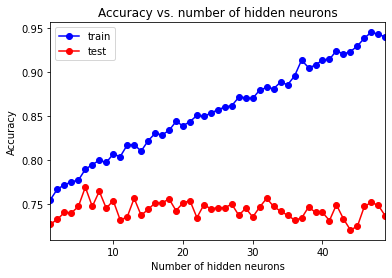

In [123]:
plt.plot(hidden_layer, train_acc, 'b-o', label = 'train')
plt.plot(hidden_layer, test_acc, 'r-o', label = 'test')
plt.xlim([np.min(hidden_layer), np.max(hidden_layer)])
plt.title('Accuracy vs. number of hidden neurons')
plt.xlabel('Number of hidden neurons')
plt.ylabel('Accuracy')
plt.legend()
pass

Посчитаю минимальное значение ошибки:

In [124]:
min_train_err = np.min(train_err)
min_test_err = np.min(test_err)
print('Ошибка на train: ', min_train_err)
print('Ошибка на test: ', min_test_err)

Ошибка на train:  0.054730777753157545
Ошибка на test:  0.23056478405315614


Тогда оптимальное количество нейронов на первом скрытом слое:

In [125]:
neuron_opt_1 = hidden_layer[test_err == min_test_err]
neuron_opt_1 = neuron_opt_1[0]

print("Оптимальное количество нейронов первого слоя:", neuron_opt_1)

Оптимальное количество нейронов первого слоя: 6


Добавлю второй скрытый слой и буду искать оптимальное количество нейронов для него:

In [109]:
hidden_layer = np.arange(1, 30)
test_err = []
train_err = []
train_acc = []
test_acc = []

for neuron in hidden_layer:
    mlp_model = MLPClassifier(alpha = alpha_opt, hidden_layer_sizes = (neuron_opt_1, neuron), solver = 'lbfgs', 
                              max_iter = 10000, activation = 'logistic', random_state = 42)
    
    mlp_model.fit(X_train, y_train)

    y_train_pred = mlp_model.predict(X_train)
    y_test_pred = mlp_model.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))
    train_acc.append(accuracy_score(y_train, y_train_pred))
    test_acc.append(accuracy_score(y_test, y_test_pred))

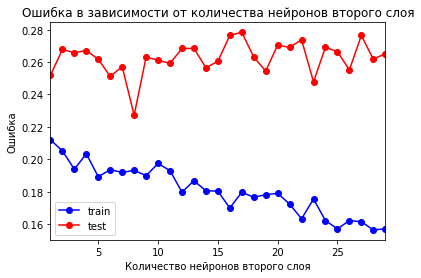

In [110]:
plt.plot(hidden_layer, train_err, 'b-o', label = 'train')
plt.plot(hidden_layer, test_err, 'r-o', label = 'test')
plt.xlim([np.min(hidden_layer), np.max(hidden_layer)])
plt.title('Ошибка в зависимости от количества нейронов второго слоя')
plt.xlabel('Количество нейронов второго слоя')
plt.ylabel('Ошибка')
plt.legend()
pass

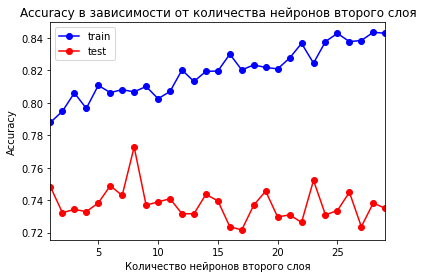

In [111]:
plt.plot(hidden_layer, train_acc, 'b-o', label = 'train')
plt.plot(hidden_layer, test_acc, 'r-o', label = 'test')
plt.xlim([np.min(hidden_layer), np.max(hidden_layer)])
plt.title('Accuracy в зависимости от количества нейронов второго слоя')
plt.xlabel('Количество нейронов второго слоя')
plt.ylabel('Accuracy')
plt.legend()
pass

In [112]:
min_train_err = np.min(train_err)
min_test_err = np.min(test_err)
print('Ошибка на train:', min_train_err)
print('Ошибка на test:', min_test_err)

Ошибка на train: 0.1564369598936406
Ошибка на test: 0.22724252491694352


In [116]:
neuron_opt_2 = hidden_layer[test_err == min_test_err][0]
print('Оптимальное значение количества нейронов второго скрытого слоя: ', neuron_opt_2)

Оптимальное значение количества нейронов второго скрытого слоя:  8


Обучим нейронную сеть с найденными оптимальными значениями alpha и количеством нейронов первого скрытого слоя:

In [117]:
mlp_model = MLPClassifier(alpha = alpha_opt, hidden_layer_sizes = (neuron_opt_1,), solver = 'lbfgs', max_iter = 10000, 
                          activation = 'logistic', random_state = 42)

mlp_model.fit(X_train, y_train)
y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

err_train = np.mean(y_train != y_train_pred)
err_test = np.mean(y_test != y_test_pred)

print("Ошибка на train:",err_train)
print("Ошибка на test:",err_test)

Ошибка на train: 0.21028140926213162
Ошибка на test: 0.23056478405315614


Теперь обучим нейронную сеть с найденными оптимальными значениями alpha и количеством нейронов первого и второго слоёв:

In [118]:
mlp_model = MLPClassifier(alpha = alpha_opt, hidden_layer_sizes = (neuron_opt_1, neuron_opt_2),
                          solver = 'lbfgs', max_iter = 10000, activation = 'logistic', random_state = 42)

mlp_model.fit(X_train, y_train)
y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

err_train = np.mean(y_train != y_train_pred)
err_test = np.mean(y_test != y_test_pred)

print("Ошибка на train:",err_train)
print("Ошибка на test:",err_test)

Ошибка на train: 0.19321958785730112
Ошибка на test: 0.22724252491694352


## Вывод:

В ходе работы произвели построение нейронной сети, нашли оптимальное значение alpha = 0.01 и оптимальное количество нейронов на первом (6) и втором (8) скрытых слоях. Ошибка на тестовой выборке составила ~23%, что повторяет результат классификации методом ближайших соседей.

# **Домашнее задание по машинному обучению №3**


## Попробую применить к моим данным ещё несколько классификаторов:
## **Extremely Randomized Trees**


In [127]:
from sklearn import ensemble

In [128]:
ert = ensemble.ExtraTreesClassifier(n_estimators = 100).fit(X_train, y_train)
err_train = np.mean(y_train != ert.predict(X_train))
err_test  = np.mean(y_test  != ert.predict(X_test))

print('Ошибка на обучающей выборке: ', err_train)
print('Ошибка на тестовой выборке: ', err_test)

Ошибка на обучающей выборке:  0.0
Ошибка на тестовой выборке:  0.17674418604651163


Ошибка метода ~18%

## **Gradient Boosting Classifier**

In [140]:
from sklearn.ensemble import GradientBoostingClassifier
errors = []
for i in range(10, 200, 20):
    boost = GradientBoostingClassifier(n_estimators=i)
    boost.fit(X_train, y_train)
    errors.append(1-boost.score(X_test, y_test))

Text(0, 0.5, 'Score')

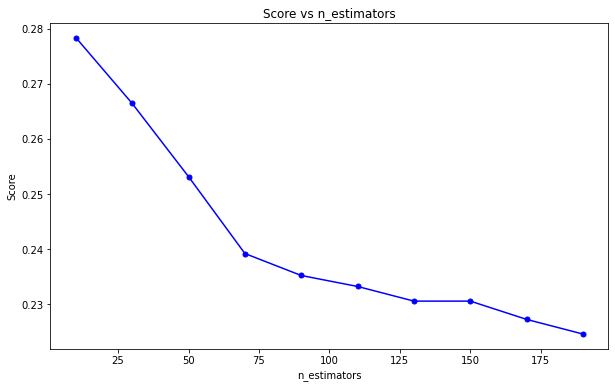

In [141]:
plt.figure(figsize=(10, 6))
plt.plot(range(10, 200, 20), errors, 
         color='blue', marker='o', markersize=5)
plt.title('Score vs n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Score')

In [142]:
boost = GradientBoostingClassifier(n_estimators=200)
boost.fit(X_train, y_train)
print(1-boost.score(X_test, y_test))

0.22458471760797338


Ошибка метода ~22%

## Попробую избавиться от параметров, которые могут быть лишними. 

In [144]:
data_try = data_stand.copy()
data_try

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1,-0.558239,-0.735840,-0.227182,0.174470,-0.832082,-0.204217,-0.987752,0.291626,-0.233625,0.532108,-0.272384,-0.843412,0.758483
2,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
3,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
4,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
5,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,1.791050,-0.817580,1.699515,-1.711339,-0.744527,1.402237,0.099464,-1.308999,0.083627,1.514324,0.416551,0.027965,-1.318201
6493,1.791050,-1.062799,1.378398,-1.566277,-0.700749,0.305147,0.522270,-1.181676,0.161178,1.972692,-0.119287,0.637930,0.758483
6494,1.791050,-0.735840,1.121505,-1.348683,-0.678861,0.853692,-0.081739,-1.381755,0.379729,1.317881,1.717872,0.463654,0.758483
6495,1.791050,-1.062799,1.988519,-1.421214,-0.744527,0.814510,0.099464,-1.308999,0.284554,2.300098,1.411679,-0.233448,-1.318201


In [147]:
data_try.pop('citric acid')

1       0.174470
2       0.609657
3       0.029408
4       0.029408
5       0.609657
          ...   
6492   -1.711339
6493   -1.566277
6494   -1.348683
6495   -1.421214
6496    1.117374
Name: citric acid, Length: 6018, dtype: float64

In [149]:
data_try.pop('total sulfur dioxide')
data_try.pop('pH')

1       0.532108
2       0.270183
3      -0.188185
4      -0.188185
5       0.270183
          ...   
6492    1.514324
6493    1.972692
6494    1.317881
6495    2.300098
6496    1.121438
Name: pH, Length: 6018, dtype: float64

In [150]:
data_try

,type,fixed acidity,volatile acidity,residual sugar,chlorides,free sulfur dioxide,density,sulphates,alcohol,quality
1,-0.558239,-0.735840,-0.227182,-0.832082,-0.204217,-0.987752,-0.233625,-0.272384,-0.843412,0.758483
2,-0.558239,0.735473,-0.355629,0.328022,-0.165035,-0.021338,0.154128,-0.655125,-0.320586,0.758483
3,-0.558239,-0.000183,-0.676745,0.678242,0.148419,1.005477,0.330379,-0.961319,-0.494861,0.758483
4,-0.558239,-0.000183,-0.676745,0.678242,0.148419,1.005477,0.330379,-0.961319,-0.494861,0.758483
5,-0.558239,0.735473,-0.355629,0.328022,-0.165035,-0.021338,0.154128,-0.655125,-0.320586,0.758483
...,...,...,...,...,...,...,...,...,...,...
6492,1.791050,-0.817580,1.699515,-0.744527,1.402237,0.099464,0.083627,0.416551,0.027965,-1.318201
6493,1.791050,-1.062799,1.378398,-0.700749,0.305147,0.522270,0.161178,-0.119287,0.637930,0.758483
6494,1.791050,-0.735840,1.121505,-0.678861,0.853692,-0.081739,0.379729,1.717872,0.463654,0.758483
6495,1.791050,-1.062799,1.988519,-0.744527,0.814510,0.099464,0.284554,1.411679,-0.233448,-1.318201


In [151]:
data_filter_new = data_filter.copy()
data_filter_new.pop('citric acid')
data_filter_new.pop('total sulfur dioxide')
data_filter_new.pop('pH')

1       3.30
2       3.26
3       3.19
4       3.19
5       3.26
        ... 
6492    3.45
6493    3.52
6494    3.42
6495    3.57
6496    3.39
Name: pH, Length: 6018, dtype: float64

In [152]:
X_new = data_try.drop(['quality'], axis=1)
y_new = data_filter_new['quality']

In [153]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X, y, test_size = 0.25, random_state = 42)

N_train, _ = X_train_new.shape 
N_test,  _ = X_test_new.shape 

N_train, N_test

(4513, 1505)

In [154]:
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train_new, y_train_new)
error_train = np.mean(y_train_new != rfc.predict(X_train_new))
error_test  = np.mean(y_test_new  != rfc.predict(X_test_new))

print('Ошибка на обучающей выборке: ', error_train)
print('Ошибка на тестовой выборке: ', error_test)

Ошибка на обучающей выборке:  0.0
Ошибка на тестовой выборке:  0.17475083056478405


In [155]:
from sklearn.model_selection import GridSearchCV
nnb = list(range(1,20))+[25, 35, 45, 55]
knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid = {'n_neighbors': nnb}, cv=10)
grid.fit(X_train_new, y_train_new)

best_cv_err = 1 - grid.best_score_
best_n_neighbors = grid.best_estimator_.n_neighbors
print(best_cv_err, best_n_neighbors)

0.22180356336950324 1


Ошибка незначительно понизилась и в методе ближайсших соседей ~22%, и в методе RandomForestClassifier ~17%. Ожидала, что увеличится количество ближайших соседей, когда количество признаков уменьшилось, но этого не произошло.

## **Выводы: **
Наилучший результат классификации получился при использовании метода RandomForestClassifier с ошибкой ~17%. Самый плохой результат с ошибкой ~23% дала нейронная сеть с двумя скрытыми слоями.